<a href="https://colab.research.google.com/github/rohit-LIGO/McGill/blob/svn---rohit-LIGO-rohit_nair17004-ls-https%2Fanag-repo.lbl.gov%2Fsvn%2Ftestrepo/Vizualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [13]:
import time, psutil, os

# Mathematical functions
import math

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import get_test_data

import seaborn as sns
sns.set_theme()
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import sklearn

In [3]:
start = time.time()
process = psutil.Process(os.getpid())

In [8]:
higgs = pd.read_csv("higgs.csv.gz")
higgs.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label,KaggleSet,KaggleWeight
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2.150,0.444,46.062,1.24,-2.475,113.497,0.000814,s,t,0.002653
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,0.725,1.158,-999.000,-999.00,-999.000,46.226,0.681042,b,t,2.233584
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,2.053,-2.028,-999.000,-999.00,-999.000,44.251,0.715742,b,t,2.347389
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,1.660654,b,t,5.446378
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,1.904263,b,t,6.245333


In [14]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(higgs, test_size=0.2)

In [15]:
def bar_donut(higgs, col, h = 500, w = 800):
    fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'xy'}, {'type': 'domain'}]])
    x_val, y_val = higgs[col].value_counts(sort = False).index.tolist(), higgs[col].value_counts(sort = False).tolist()
    fig.add_trace(go.Bar(x = x_val, y = y_val, text = y_val, textposition = 'auto'), row = 1, col = 1)
    fig.add_trace(go.Pie(values = y_val, labels = x_val, hole = 0.5, textinfo = 'label+percent', title = f"{col}"), row = 1, col = 2)
    fig.update_layout(height = h, width = w, showlegend = False, xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1), title = dict(text = f"Frequency distribution of {col}", x = 0.5, y = 0.95)) 
    fig.show()

In [16]:
bar_donut(train, 'Label')

In [17]:
train_b = train[train['Label'] == 'b'] 
train_s = train[train['Label'] == 's'] 

In [19]:
higgs_unique = pd.DataFrame()
higgs_unique['Training set (background events)'] = [train_b[col].nunique() for col in test.columns]
higgs_unique['Training set (signal events)'] = [train_s[col].nunique() for col in test.columns]
higgs_unique['Training set (all events)'] = [train[col].nunique() for col in test.columns]
higgs_unique['Test set (all events)'] = [test[col].nunique() for col in test.columns]
higgs_unique.set_index(test.columns, inplace = True)
higgs_unique.style.set_caption("Number of unique values for the predictor variables")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
EventId,430902,223688,654590,163648
DER_mass_MMC,148470,80617,163340,85646
DER_mass_transverse_met_lep,121762,79065,127134,85874
DER_mass_vis,137671,70802,143442,82562
DER_pt_h,134862,124418,176343,91032
DER_deltaeta_jet_jet,6257,7569,7599,6803
DER_mass_jet_jet,93560,81074,163838,45758
DER_prodeta_jet_jet,15623,18532,21013,14536
DER_deltar_tau_lep,4954,3625,4955,4526
DER_pt_tot,71168,56115,79691,50255


In [20]:
def minus_999(df):
    index = [col for col in df.columns if -999 in higgs[col].value_counts().index]
    data = [higgs[col].value_counts()[-999]/len(higgs) for col in index]
    return pd.Series(index = index, data = data).sort_values(ascending = False)

higgs_minus_999 = pd.DataFrame()
higgs_minus_999['Training set (background events)'] = minus_999(train_b).values
higgs_minus_999['Training set (signal events)'] = minus_999(train_s).values
higgs_minus_999['Training set (all events)'] = minus_999(train).values
higgs_minus_999['Test set (all events)'] = minus_999(test).values
higgs_minus_999.set_index(minus_999(train).index, inplace = True)
higgs_minus_999.style.set_caption("Proportion of the value -999 in the dataset columns which contain -999")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_deltaeta_jet_jet,0.709149,0.709149,0.709149,0.709149
DER_mass_jet_jet,0.709149,0.709149,0.709149,0.709149
DER_prodeta_jet_jet,0.709149,0.709149,0.709149,0.709149
DER_lep_eta_centrality,0.709149,0.709149,0.709149,0.709149
PRI_jet_subleading_pt,0.709149,0.709149,0.709149,0.709149
PRI_jet_subleading_eta,0.709149,0.709149,0.709149,0.709149
PRI_jet_subleading_phi,0.709149,0.709149,0.709149,0.709149
PRI_jet_leading_pt,0.400093,0.400093,0.400093,0.400093
PRI_jet_leading_eta,0.400093,0.400093,0.400093,0.400093
PRI_jet_leading_phi,0.400093,0.400093,0.400093,0.400093


In [21]:
train_temp = train.copy(deep = True)
train_temp['dataset'] = "Train"
test_temp = test.copy(deep = True)
test_temp['dataset'] = "Test"
data = pd.concat([train_temp, test_temp], axis = 0, ignore_index = True)

In [22]:
def hist(higgs, cols, bins, ncols = 3):
    nrows = math.ceil(len(cols) / ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize = (5 * ncols, 4.2 * nrows), sharey = False)
    for i in range(len(cols)):
        sns.histplot(data = higgs, x = cols[i], bins = bins, hue = 'dataset', palette = ['red', 'grey'], ax = ax[i // ncols, i % ncols])
        ax[i // ncols, i % ncols].set_xlabel(cols[i])
        if i % ncols != 0:
            ax[i // ncols, i % ncols].set_ylabel(" ")
    plt.tight_layout()
    plt.show()

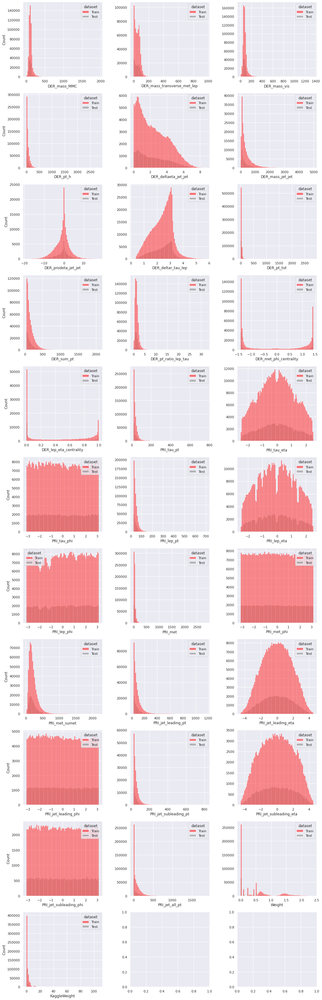

In [23]:
hist(data.replace(-999, np.nan),
     list(test.columns[test.dtypes == 'float64']),
     bins = max(math.floor(len(train)**(1/3)), math.floor(len(test)**(1/3))),
     ncols = 3)

In [29]:
def hist(higgs, cols, target, bins, ncols = 3):
    nrows = math.ceil(len(cols) / ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize = (5 * ncols, 4.2 * nrows), sharey = False)
    for i in range(len(cols)):
        sns.histplot(data = higgs, x = cols[i], bins = bins, hue = target, palette = ['red', 'grey'], ax = ax[i // ncols, i % ncols])
        ax[i // ncols, i % ncols].set_xlabel(cols[i])
        if i % ncols != 0:
            ax[i // ncols, i % ncols].set_ylabel(" ")
    plt.tight_layout()
    plt.show()

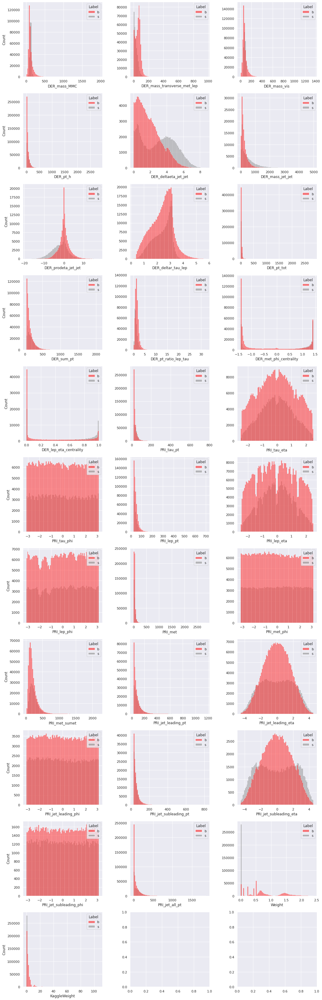

In [30]:
hist(data.replace(-999, np.nan),
     list(test.columns[test.dtypes == 'float64']), target='Label',
     bins = max(math.floor(len(train)**(1/3)), math.floor(len(test)**(1/3))),
     ncols = 3)

In [31]:
higgs_skew = pd.DataFrame()
cols_float_test = test.columns[test.dtypes == 'float64']
skew_train_b = train_b.replace(-999, np.nan)[cols_float_test].skew().values
skew_train_s = train_s.replace(-999, np.nan)[cols_float_test].skew().values
skew_train = train.replace(-999, np.nan)[cols_float_test].skew().values
skew_test = test.replace(-999, np.nan)[cols_float_test].skew().values
higgs_skew['Training set (background events)'], higgs_skew['Training set (signal events)'] = skew_train_b, skew_train_s
higgs_skew['Training set (all events)'], higgs_skew['Test set (all events)'] = skew_train, skew_test
higgs_skew.set_index(np.array(cols_float_test), inplace = True)
higgs_skew.style.set_caption("Skewness of the float features")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,3.248098,4.826513,3.797678,3.887064
DER_mass_transverse_met_lep,1.015352,2.874893,1.318036,1.212594
DER_mass_vis,3.227484,3.689038,3.637071,3.861329
DER_pt_h,2.453516,2.118747,2.376168,2.276905
DER_deltaeta_jet_jet,0.793411,0.109661,0.579705,0.579906
DER_mass_jet_jet,2.728492,1.786039,2.461378,2.391263
DER_prodeta_jet_jet,0.212033,-0.155289,-0.333235,-0.342021
DER_deltar_tau_lep,-0.123202,-0.522357,-0.222989,-0.227239
DER_pt_tot,2.703254,11.492090,5.933509,2.679589
DER_sum_pt,2.702275,1.975626,2.369815,2.307414


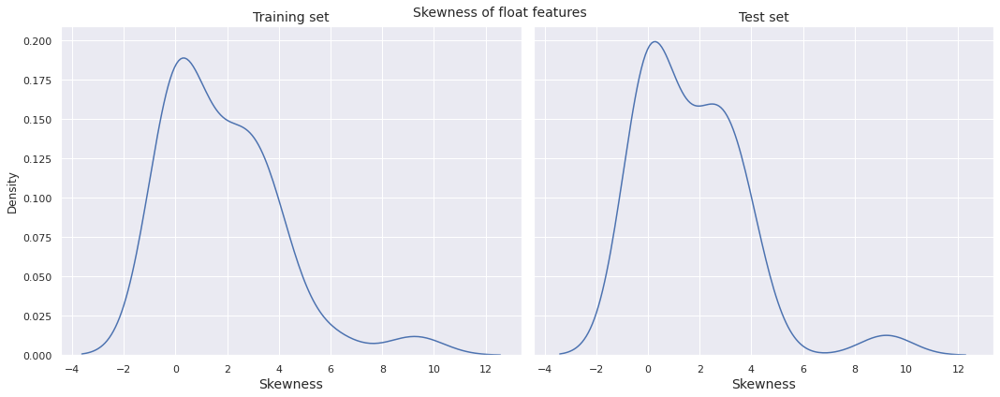

In [32]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_skew, x = 'Training set (all events)', ax = ax[0])
sns.kdeplot(data = higgs_skew, x = 'Test set (all events)', ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Skewness", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Skewness", fontsize = 14)
plt.suptitle("Skewness of float features", fontsize = 14)
plt.tight_layout()
plt.show()

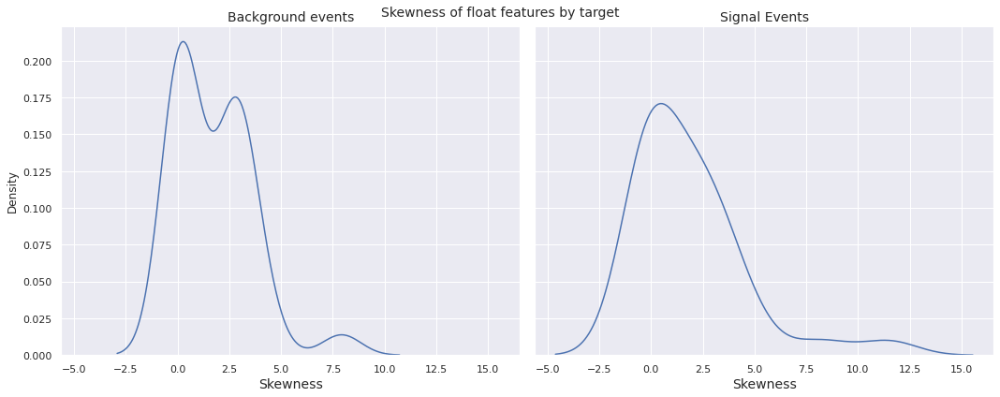

In [36]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_skew, x = 'Training set (background events)', ax = ax[0])
sns.kdeplot(data = higgs_skew, x = 'Training set (signal events)', ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Skewness", fontsize = 14)
ax[1].set_title("Signal Events", fontsize = 14)
ax[1].set_xlabel("Skewness", fontsize = 14)
plt.suptitle("Skewness of float features by target", fontsize = 14)
plt.tight_layout()
plt.show()

In [37]:
higgs_kurt = pd.DataFrame()
cols_float_test = test.columns[test.dtypes == 'float64']
kurt_train_b = train_b.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_train_s = train_s.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_train = train.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_test = test.replace(-999, np.nan)[cols_float_test].kurt().values
higgs_kurt['Training set (background events)'], higgs_kurt['Training set (signal events)'] = kurt_train_b, kurt_train_s
higgs_kurt['Training set (all events)'], higgs_kurt['Test set (all events)'] = kurt_train, kurt_test
higgs_kurt.set_index(np.array(cols_float_test), inplace = True)
higgs_kurt.style.set_caption("Skewness of the float features")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,18.540518,84.943631,27.960391,33.210110
DER_mass_transverse_met_lep,8.766375,22.627962,8.753522,6.417489
DER_mass_vis,21.813014,60.737593,29.763610,39.874189
DER_pt_h,9.622896,14.354206,13.518776,8.889860
DER_deltaeta_jet_jet,0.054462,-1.050945,-0.572212,-0.577835
DER_mass_jet_jet,12.333481,4.166337,8.380859,7.675148
DER_prodeta_jet_jet,2.668502,0.590055,1.527678,1.463129
DER_deltar_tau_lep,-0.216894,-0.614771,-0.229721,-0.242889
DER_pt_tot,15.943515,1106.367631,426.487860,15.119783
DER_sum_pt,12.313320,6.783851,9.604624,9.015194


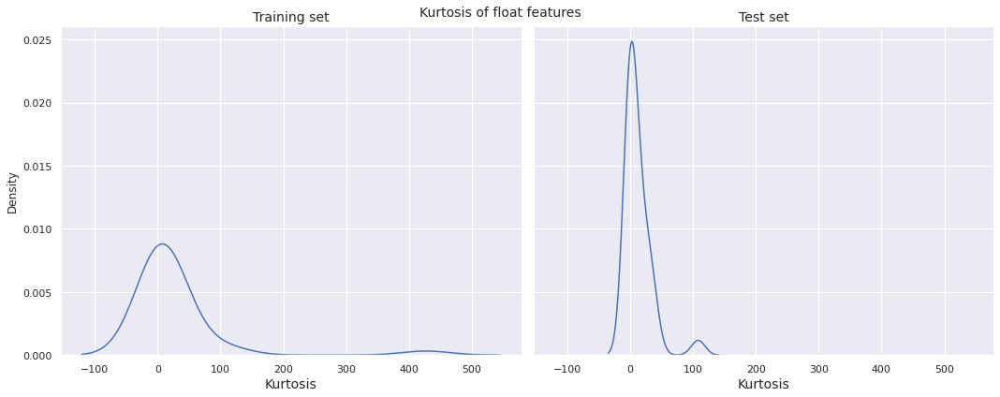

In [38]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_kurt, x = 'Training set (all events)', ax = ax[0])
sns.kdeplot(data = higgs_kurt, x = 'Test set (all events)', ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Kurtosis", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Kurtosis", fontsize = 14)
plt.suptitle("Kurtosis of float features", fontsize = 14)
plt.tight_layout()
plt.show()

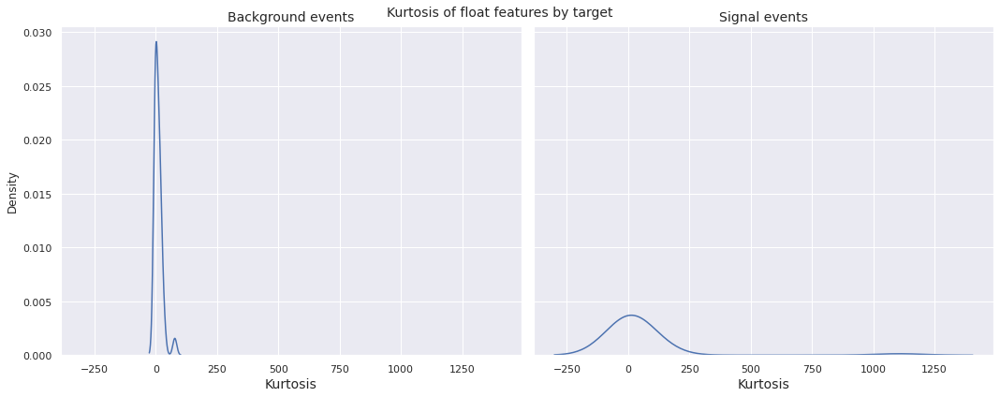

In [39]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_kurt, x = 'Training set (background events)', ax = ax[0])
sns.kdeplot(data = higgs_kurt, x = 'Training set (signal events)', ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Kurtosis", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Kurtosis", fontsize = 14)
plt.suptitle("Kurtosis of float features by target", fontsize = 14)
plt.tight_layout()
plt.show()

In [40]:
higgs_corr = pd.DataFrame(columns = ['feature_1', 'feature_2', 'Training set (background events)', 'Training set (signal events)', 'Training set (all events)', 'Test set (all events)'])
cols = cols_float_test
for i in range(len(cols)):
    for j in range(len(cols)):
        if i<j:
            higgs_corr.loc[len(higgs_corr.index)] = [cols[i], cols[j], train_b[cols[i]].corr(train_b[cols[j]]), train_s[cols[i]].corr(train_s[cols[j]]), train[cols[i]].corr(train[cols[j]]), test[cols[i]].corr(test[cols[j]])]
higgs_corr.sort_values(by = 'Training set (all events)', ascending = False, inplace = True)
higgs_corr # df_corr.style.set_caption("Correlation coefficient of pairs of float features")

,feature_1,feature_2,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
121,DER_deltaeta_jet_jet,DER_lep_eta_centrality,0.999999,0.999998,0.999998,0.999998
308,DER_lep_eta_centrality,PRI_jet_subleading_phi,0.999998,0.999997,0.999998,0.999998
307,DER_lep_eta_centrality,PRI_jet_subleading_eta,0.999998,0.999996,0.999997,0.999997
136,DER_deltaeta_jet_jet,PRI_jet_subleading_phi,0.999997,0.999994,0.999996,0.999996
135,DER_deltaeta_jet_jet,PRI_jet_subleading_eta,0.999997,0.999993,0.999995,0.999995
...,...,...,...,...,...,...
257,DER_pt_ratio_lep_tau,PRI_tau_pt,-0.427741,-0.497893,-0.474706,-0.471454
448,PRI_jet_leading_phi,Weight,-0.635322,-0.505241,-0.503360,-0.505752
442,PRI_jet_leading_eta,Weight,-0.635324,-0.505248,-0.503362,-0.505762
435,PRI_jet_leading_pt,Weight,-0.646296,-0.514913,-0.512509,-0.514776


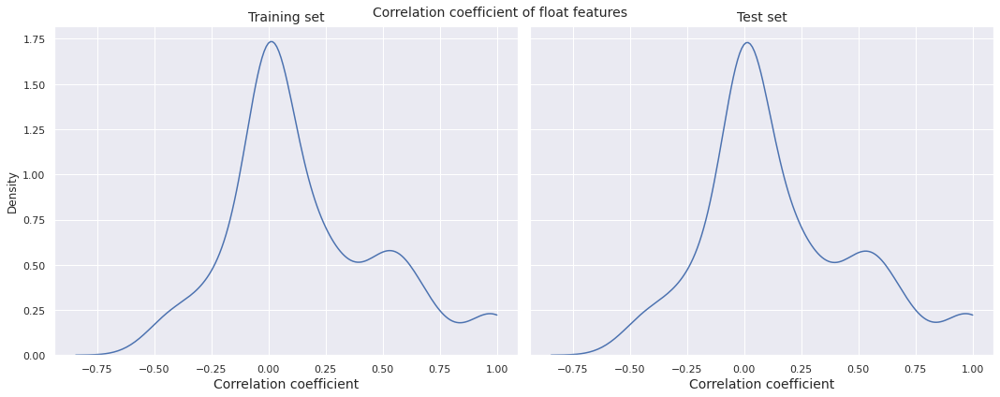

In [41]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_corr, x = 'Training set (all events)', clip = (-1.0, 1.0), ax = ax[0])
sns.kdeplot(data = higgs_corr, x = 'Test set (all events)', clip = (-1.0, 1.0), ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Correlation coefficient", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Correlation coefficient", fontsize = 14)
plt.suptitle("Correlation coefficient of float features", fontsize = 14)
plt.tight_layout()
plt.show()

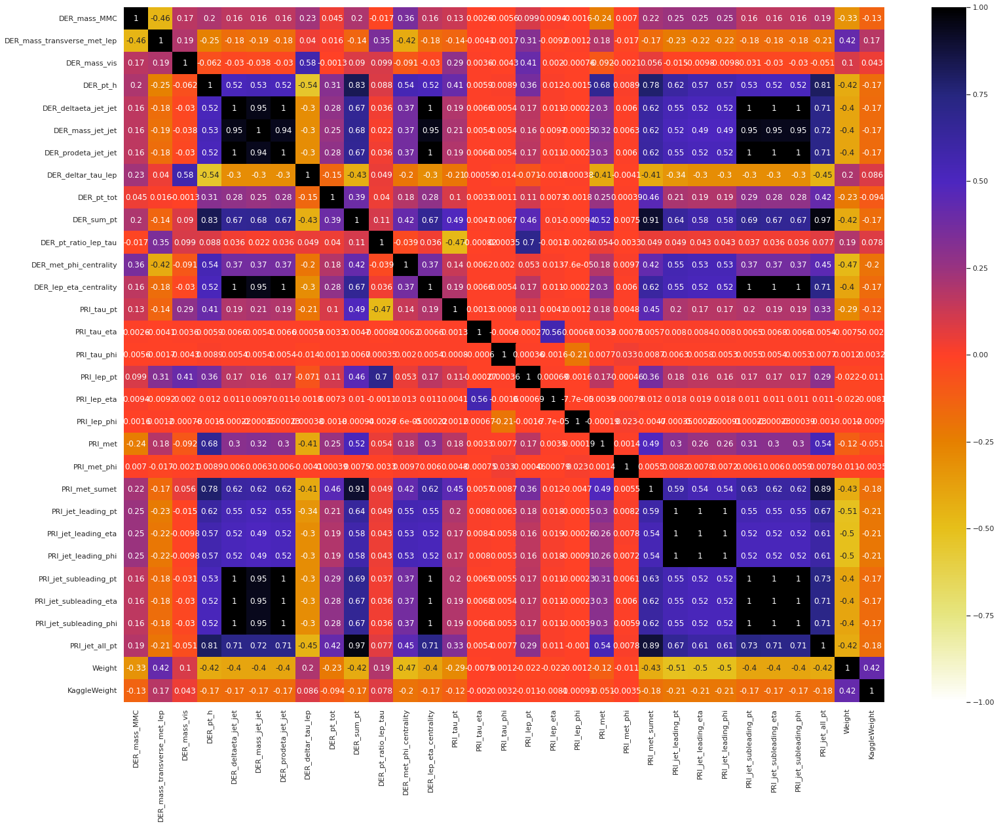

In [42]:
plt.figure(figsize = (26, 19.5))
sns.heatmap(train[cols_float_test].corr(), vmin = -1, vmax = 1, annot = True, cmap = plt.cm.CMRmap_r)

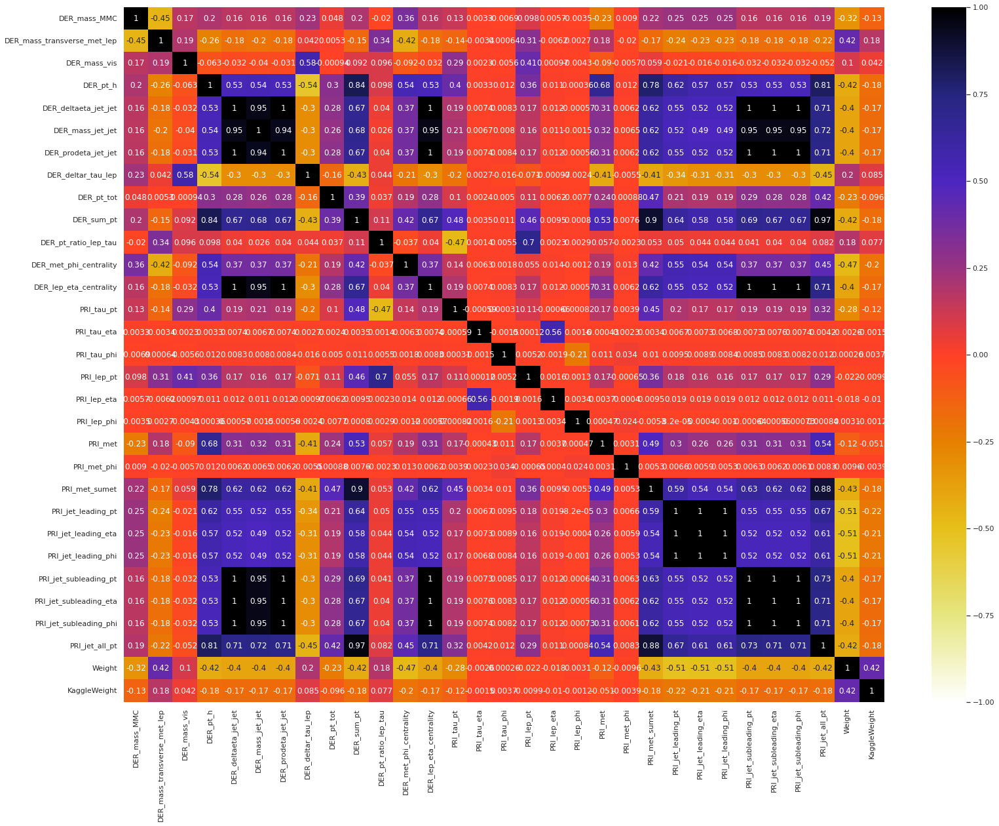

In [43]:
plt.figure(figsize = (26, 19.5))
sns.heatmap(test[cols_float_test].corr(), vmin = -1, vmax = 1, annot = True, cmap = plt.cm.CMRmap_r)

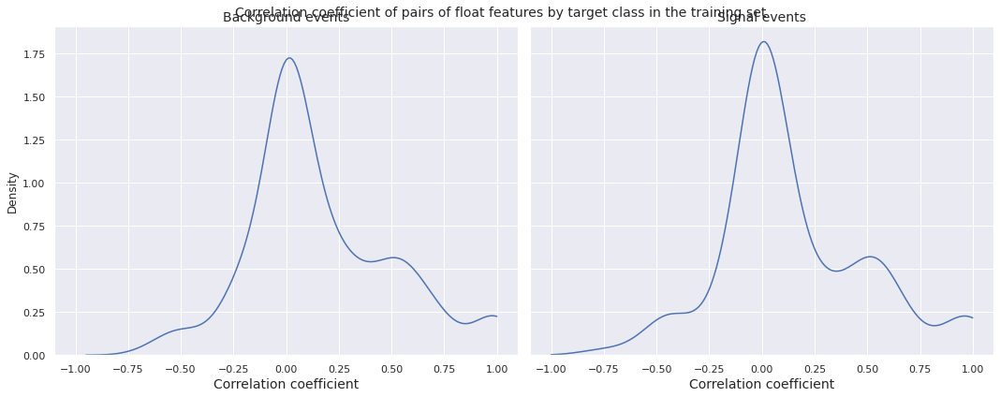

In [44]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = higgs_corr, x = 'Training set (background events)', clip = (-1.0, 1.0), ax = ax[0])
sns.kdeplot(data = higgs_corr, x = 'Training set (signal events)', clip = (-1.0, 1.0), ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Correlation coefficient", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Correlation coefficient", fontsize = 14)
plt.suptitle("Correlation coefficient of pairs of float features by target class in the training set", fontsize = 14)
plt.tight_layout()
plt.show()

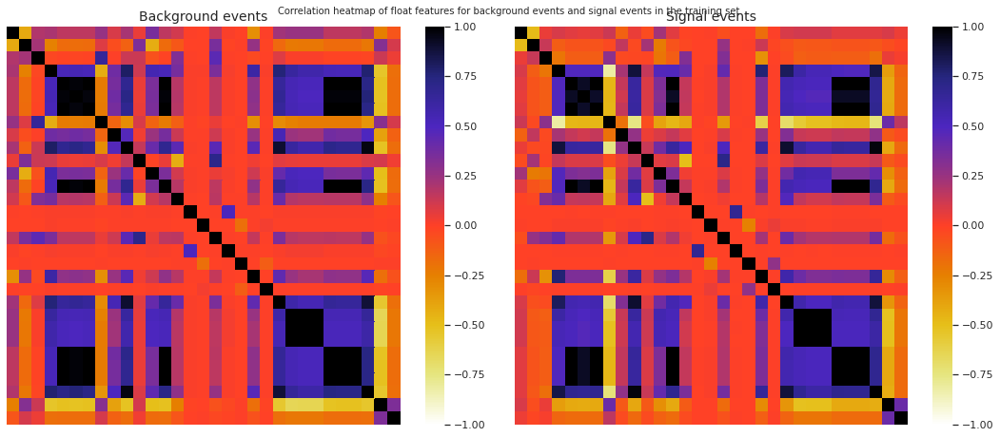

In [46]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6.5), sharex = True, sharey = True)
sns.heatmap(train_b[cols_float_test].corr(), vmin = -1, vmax = 1, annot = False, xticklabels = False, yticklabels = False, cmap = plt.cm.CMRmap_r, ax = ax[0])
sns.heatmap(train_s[cols_float_test].corr(), vmin = -1, vmax = 1, annot = False, xticklabels = False, yticklabels = False, cmap = plt.cm.CMRmap_r, ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
plt.suptitle("Correlation heatmap of float features for background events and signal events in the training set", fontsize = 10)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



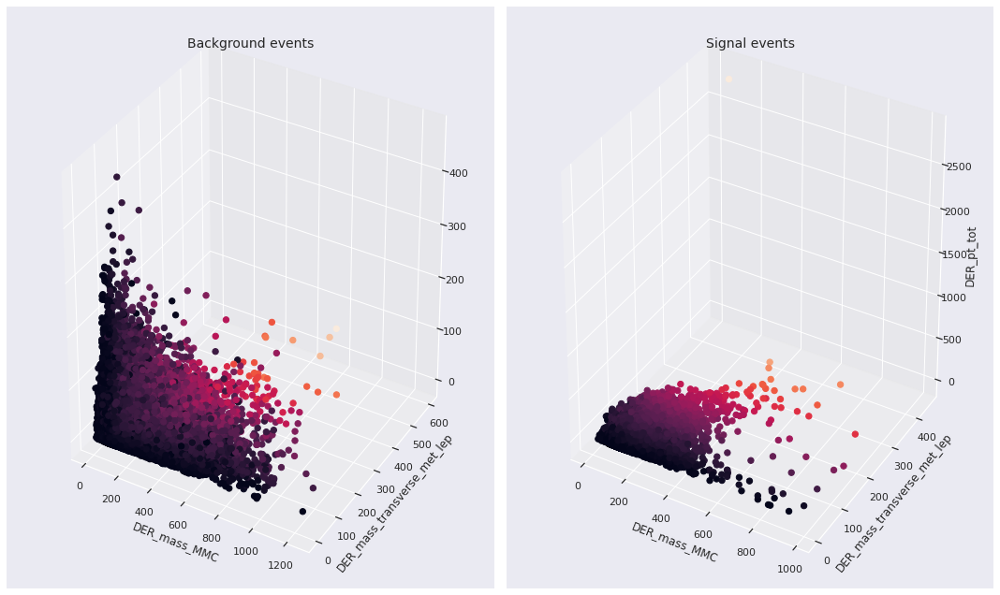

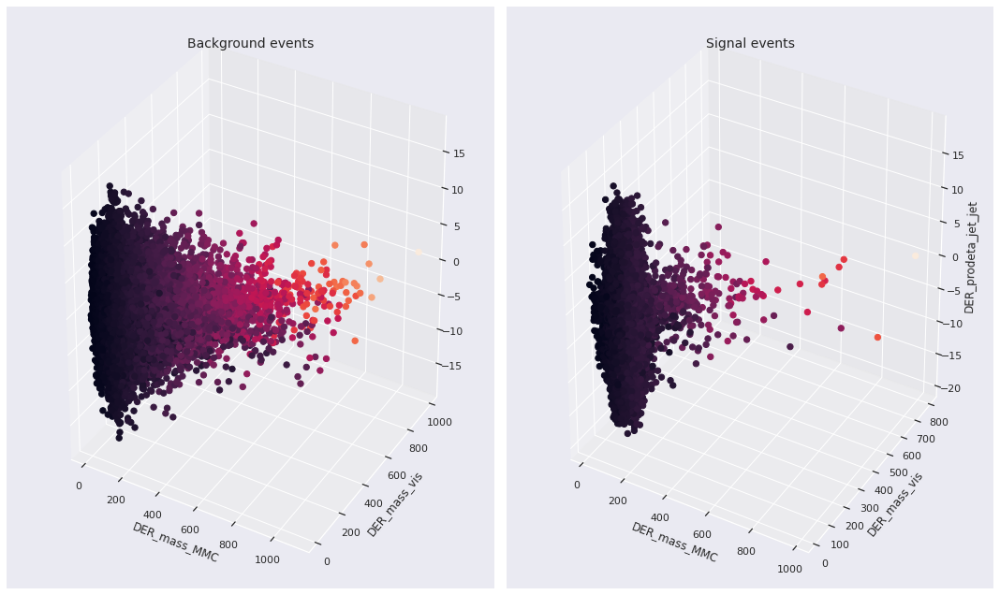

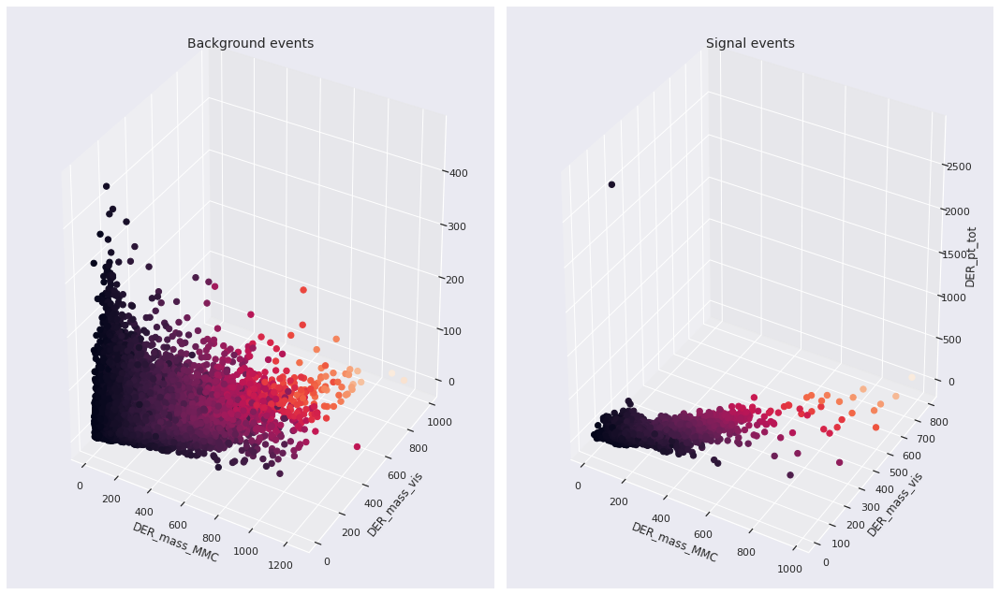

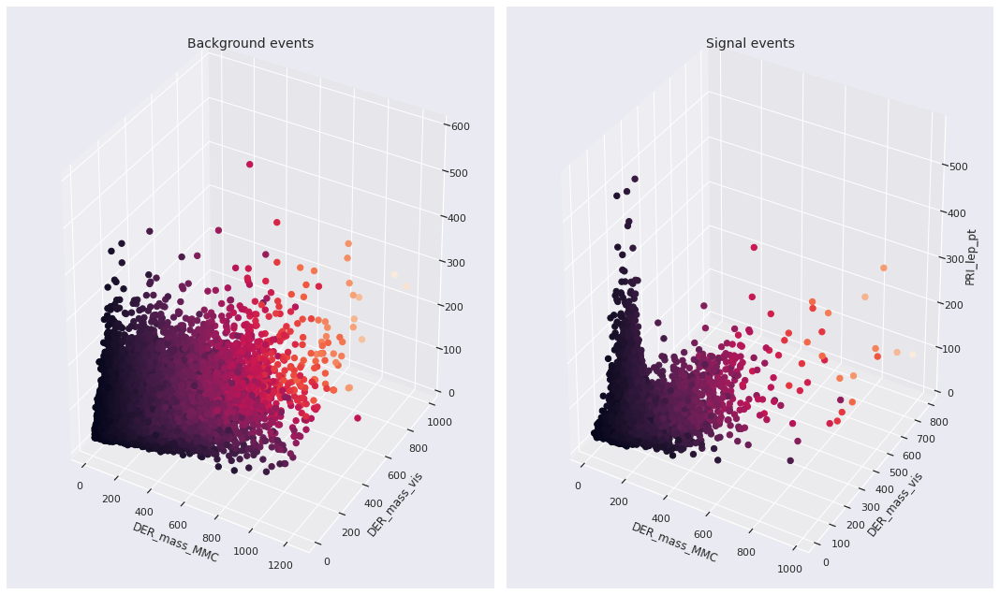

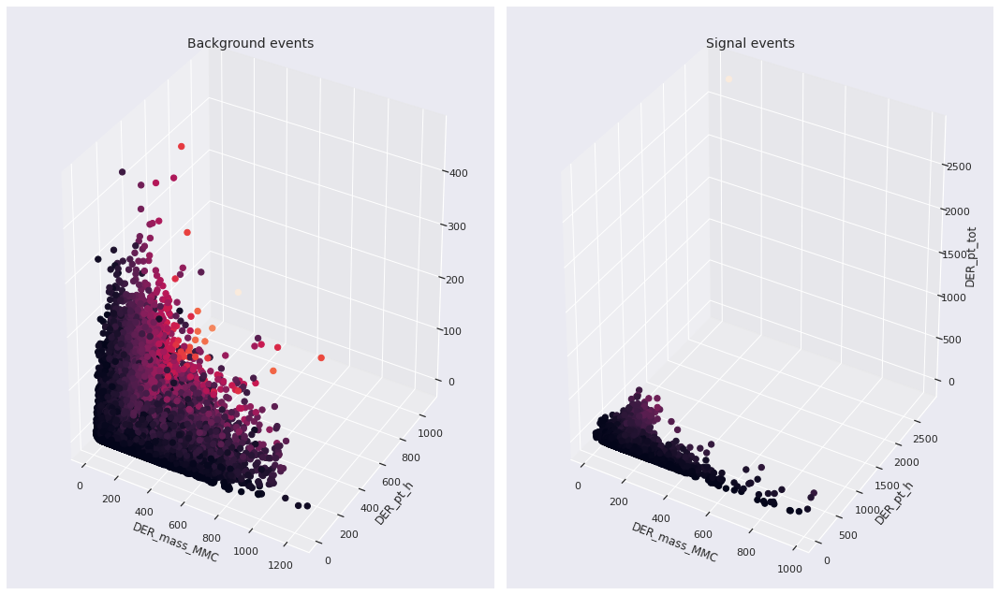

...

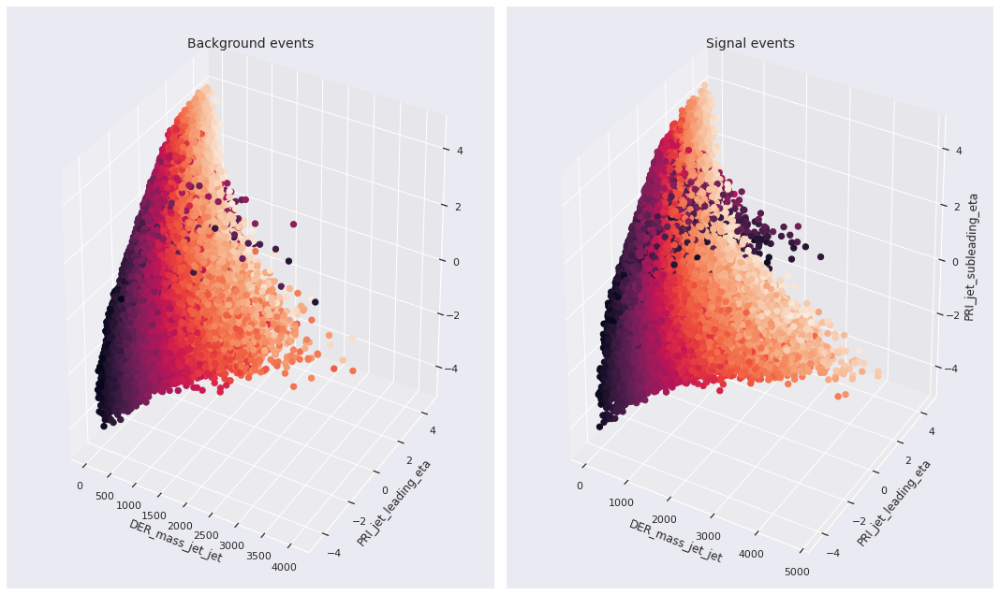

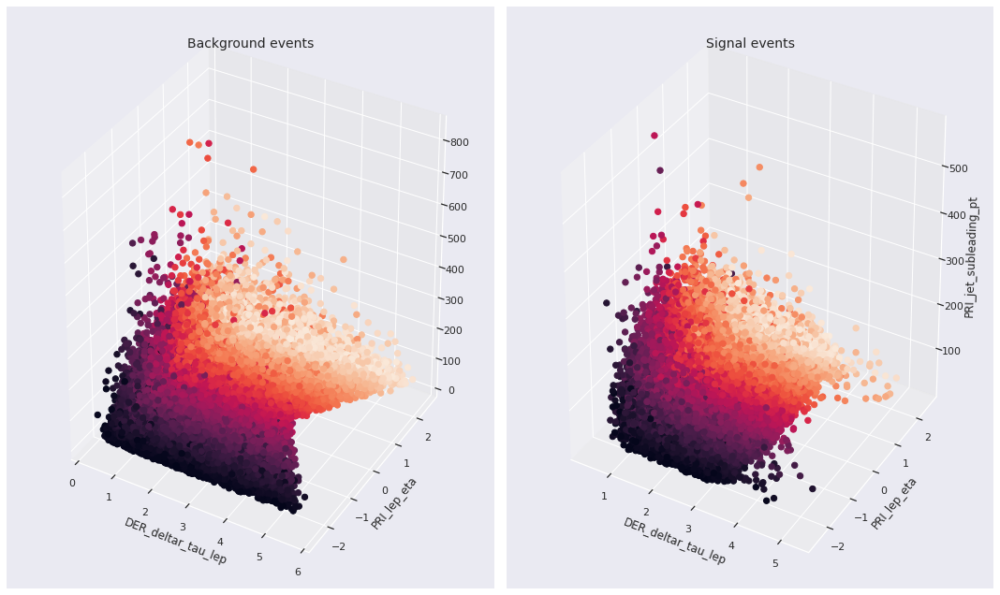

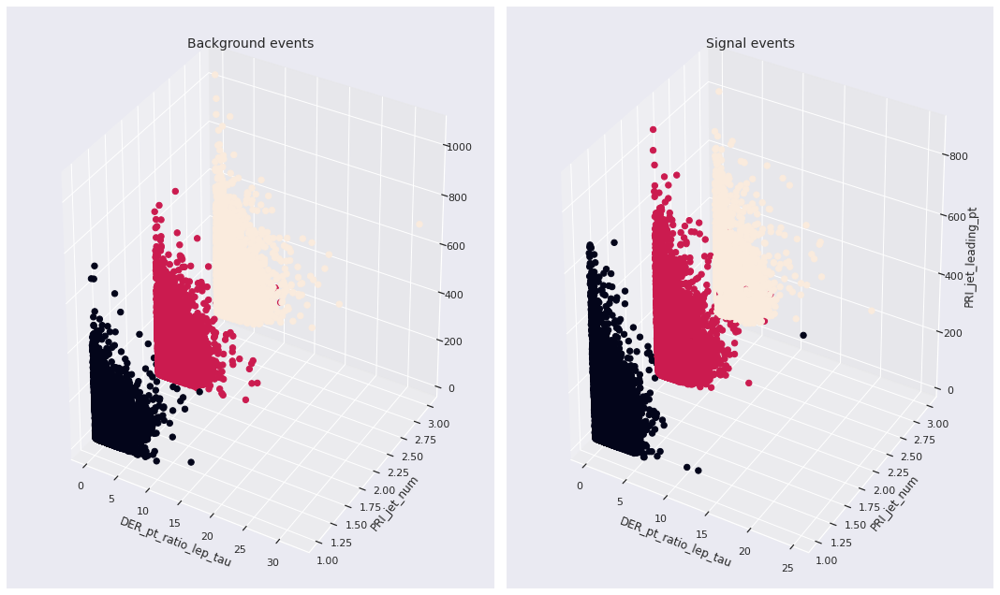

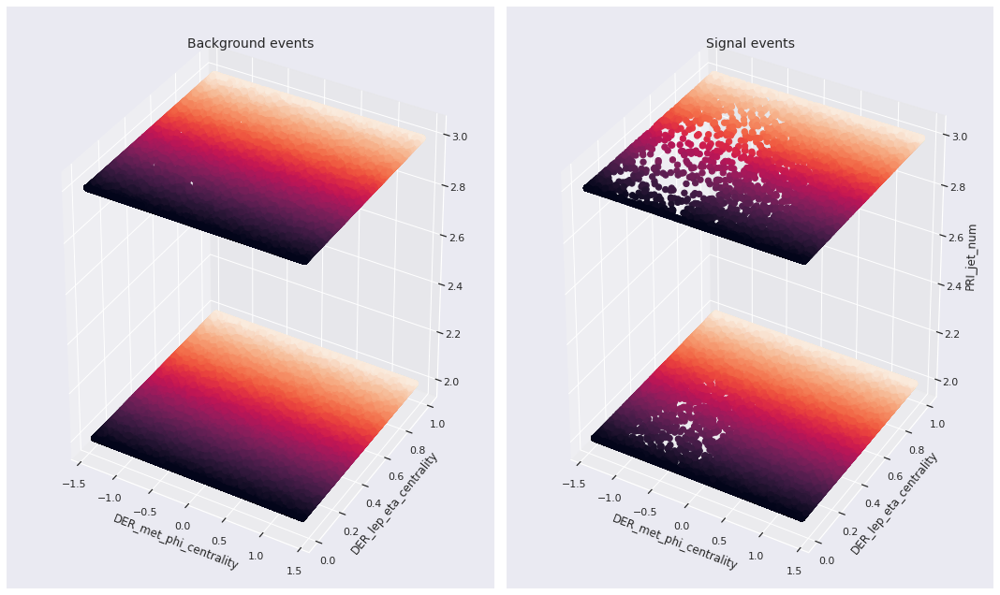

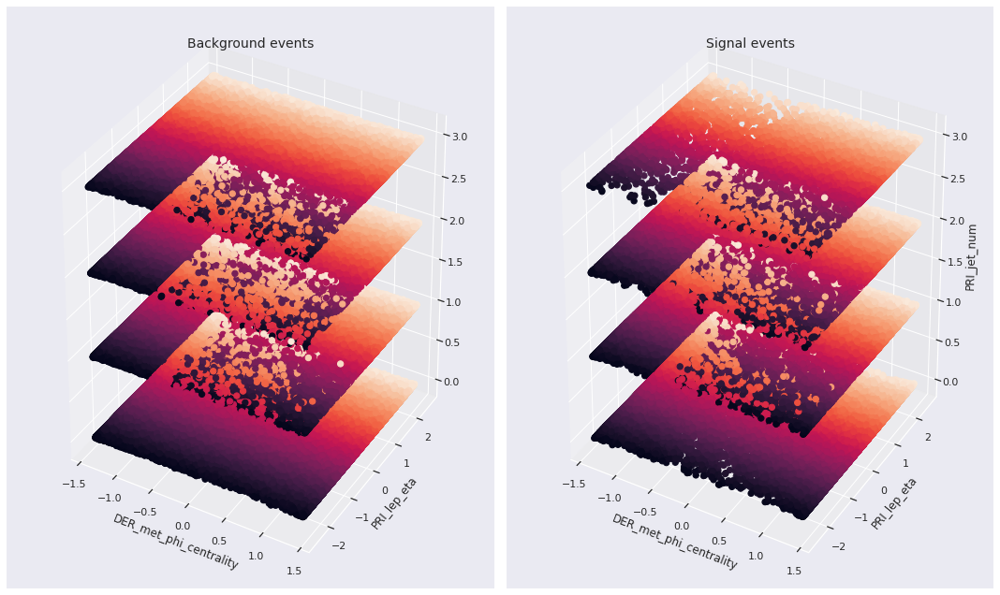

In [47]:
triples_selected = [
    ('DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_prodeta_jet_jet'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'PRI_lep_pt'),
    ('DER_mass_MMC', 'DER_pt_h', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_pt_h', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'DER_deltaeta_jet_jet', 'PRI_jet_num'),
    ('DER_mass_MMC', 'DER_mass_jet_jet', 'PRI_jet_subleading_eta'),
    ('DER_mass_MMC', 'DER_prodeta_jet_jet', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_met'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_mass_MMC', 'PRI_met_phi', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_mass_vis', 'DER_pt_h', 'PRI_jet_leading_pt'),
    ('DER_pt_h', 'PRI_jet_num', 'PRI_jet_leading_eta'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_eta'),('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_phi'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_all_pt'),
    ('DER_deltaeta_jet_jet', 'DER_met_phi_centrality', 'PRI_jet_num'),
    ('DER_mass_jet_jet', 'DER_deltar_tau_lep', 'PRI_lep_pt'),
    ('DER_mass_jet_jet', 'PRI_tau_pt', 'PRI_jet_subleading_eta'),
    ('DER_prodeta_jet_jet', 'DER_sum_pt', 'PRI_jet_all_pt'),
    ('DER_mass_jet_jet', 'PRI_jet_leading_eta', 'PRI_jet_subleading_eta'),
    ('DER_deltar_tau_lep', 'PRI_lep_eta', 'PRI_jet_subleading_pt'),
    ('DER_pt_ratio_lep_tau', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_met_phi_centrality', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_met_phi_centrality', 'PRI_lep_eta', 'PRI_jet_num')
]
for z in triples_selected:
    fig = plt.figure(figsize = (15, 9))
    ax = fig.add_subplot(1, 2, 1, projection = '3d')
    x_b = train_b.replace(-999, np.nan)[z[0]]
    y_b = train_b.replace(-999, np.nan)[z[1]]
    z_b = train_b.replace(-999, np.nan)[z[2]]
    s1 = ax.scatter(x_b, y_b, z_b, s = 40, marker = 'o', c = y_b, alpha = 1)
    ax.set_title("Background events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1]) # ax.set_zlabel(z[2])
    ax = fig.add_subplot(1, 2, 2, projection = '3d')
    x_s = train_s.replace(-999, np.nan)[z[0]]
    y_s = train_s.replace(-999, np.nan)[z[1]]
    z_s = train_s.replace(-999, np.nan)[z[2]]
    s2 = ax.scatter(x_s, y_s, z_s, s = 40, marker = 'o', c = y_s, alpha = 1)
    ax.set_title("Signal events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1])
    ax.set_zlabel(z[2])
    plt.tight_layout()

plt.show()